In [6]:
from ucimlrepo import fetch_ucirepo
from implementations import bayes
from implementations import id3
from implementations import random_forest
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
from typing import Tuple
import pandas as pd
import time
import importlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import random
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt

In [7]:
X = np.loadtxt("../data_processed/healthcare/percentile_n_hotone/X.csv", dtype=float, delimiter=",")
y = np.loadtxt("../data_processed/healthcare/percentile_n_hotone/y.csv", dtype=float, delimiter=",")


[1.27870048e-09 1.18047611e-09 1.23525761e-09] 0.0
[1.53279346e-09 1.54065418e-09 1.34559109e-09] 2.0
[1.53299433e-09 1.59178468e-09 1.44242595e-09] 2.0
[1.51000678e-09 1.38112252e-09 1.45166696e-09] 2.0
[1.63980038e-09 1.76463643e-09 1.71932659e-09] 2.0
[1.62089574e-09 1.26919148e-09 1.52225752e-09] 2.0
[1.41044360e-09 1.49315588e-09 1.40855534e-09] 2.0
[1.42257550e-09 1.47502063e-09 1.48797649e-09] 2.0
[1.42737385e-09 1.29040627e-09 1.47808763e-09] 2.0
[1.37505673e-09 1.35540922e-09 1.45580465e-09] 2.0
[1.59513461e-09 1.52652816e-09 1.55238953e-09] 2.0
[1.37242056e-09 1.54638366e-09 1.54963606e-09] 2.0
[1.28999936e-09 1.14491451e-09 1.30545615e-09] 1.0
[1.64809965e-09 1.49254446e-09 1.48418236e-09] 1.0
[1.27489704e-09 1.41153059e-09 1.25295501e-09] 2.0
[1.18580738e-09 1.40593938e-09 1.32767158e-09] 2.0
[1.31079646e-09 1.61376951e-09 1.48723267e-09] 2.0
[1.50828815e-09 1.49698137e-09 1.35748354e-09] 1.0
[1.45437444e-09 1.48234039e-09 1.35516629e-09] 0.0
[1.67889603e-09 1.80147481e-09 

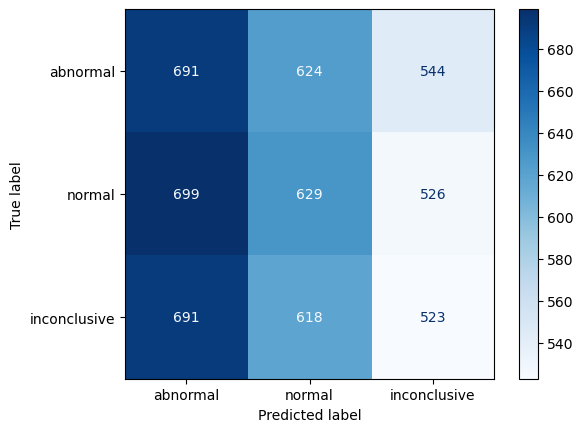

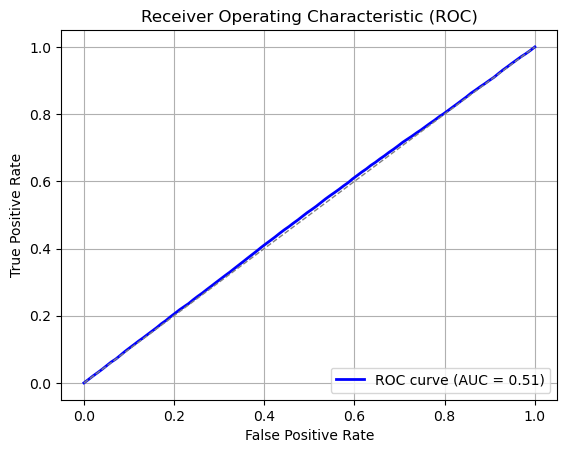

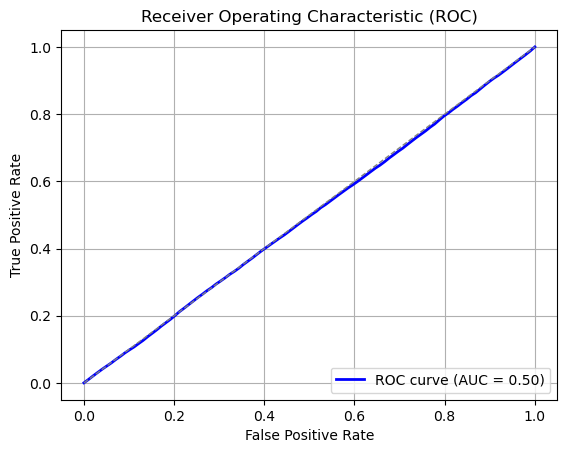

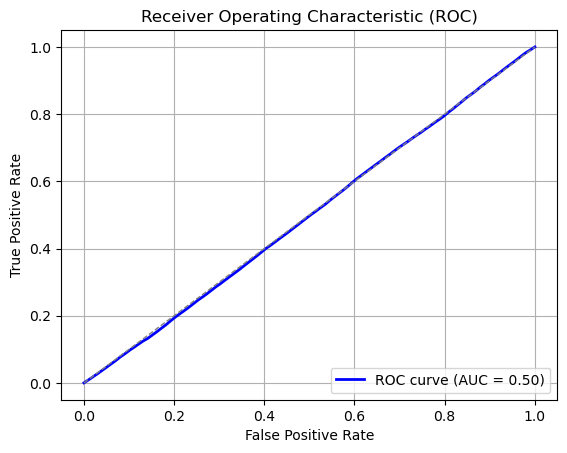

In [8]:
#################### BAYES
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    bay = bayes.NaiveBayes()
    bay.fit(x_train, y_train)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = bay.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")

cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.3       0.4483871 0.2516129] 0.0
[0.34485576 0.32065866 0.33448558] 2.0
[0.31306306 0.27927928 0.40765766] 1.0
[0.40384615 0.32692308 0.26923077] 2.0
[0.34485576 0.32065866 0.33448558] 2.0
[0.35330793 0.33737444 0.30931763] 1.0
[0.29441624 0.36548223 0.34010152] 2.0
[0.38341969 0.38341969 0.23316062] 1.0
[0.33009225 0.34779357 0.32211419] 0.0
[0.34485576 0.32065866 0.33448558] 1.0
[0.34485576 0.32065866 0.33448558] 0.0
[0.35330793 0.33737444 0.30931763] 1.0
[0.35330793 0.33737444 0.30931763] 0.0
[0.34485576 0.32065866 0.33448558] 2.0
[0.31922791 0.3277654  0.35300668] 2.0
[0.34485576 0.32065866 0.33448558] 2.0
[0.33396947 0.33396947 0.33206107] 1.0
[0.2        0.46153846 0.33846154] 0.0
[0.34485576 0.32065866 0.33448558] 0.0
[0.31787784 0.32991529 0.35220687] 1.0
[0.33009225 0.34779357 0.32211419] 2.0
[0.34485576 0.32065866 0.33448558] 2.0
[0.34485576 0.32065866 0.33448558] 2.0
[0.23611111 0.26388889 0.5       ] 2.0
[0.16216216 0.62162162 0.21621622] 1.0
[0.31476323 0.35004643 0.335

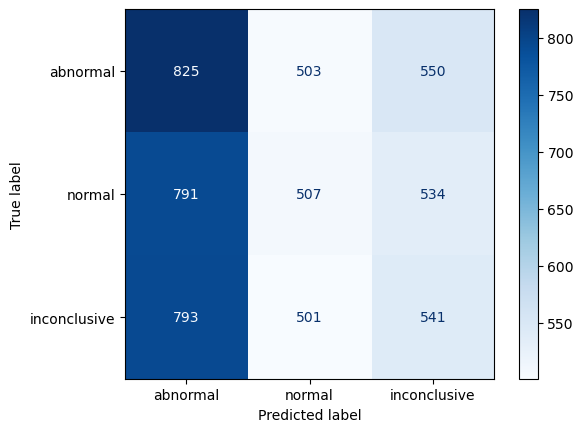

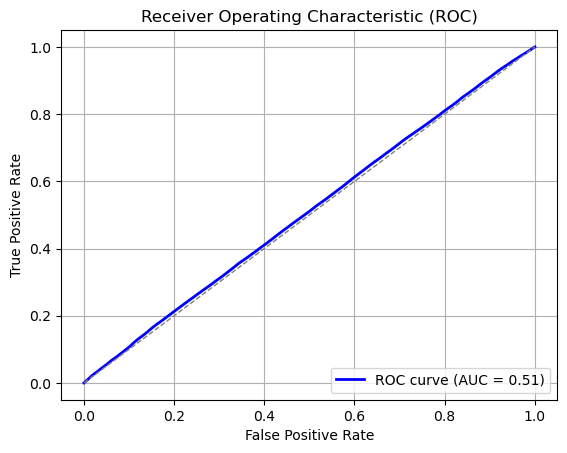

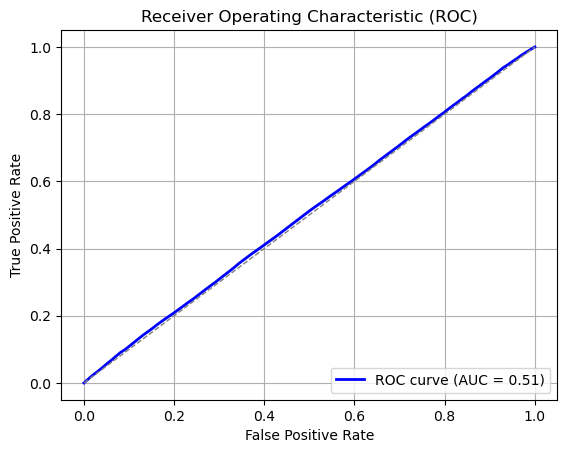

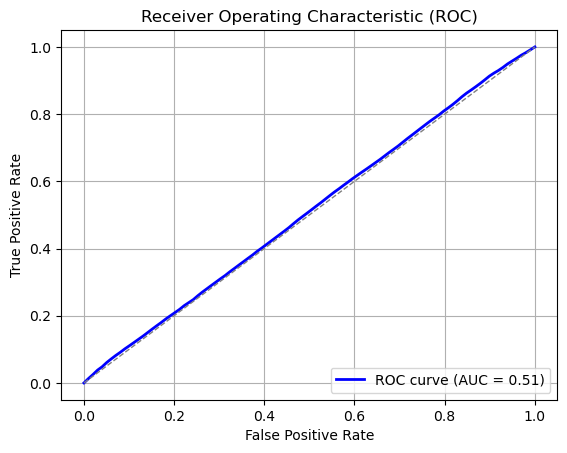

In [10]:
#################### ID3
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    tree = id3.DecisionTreeClassifier(10)
    tree.fit(x_train, y_train)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = tree.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")

cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.38 0.44 0.18] 1.0
[0.42 0.22 0.36] 1.0
[0.38 0.36 0.26] 0.0
[0.28 0.32 0.4 ] 1.0
[0.34 0.28 0.38] 1.0
[0.38 0.38 0.24] 0.0
[0.28 0.28 0.44] 2.0
[0.28 0.46 0.26] 2.0
[0.32 0.32 0.36] 1.0
[0.28 0.42 0.3 ] 0.0
[0.3  0.38 0.32] 1.0
[0.4 0.4 0.2] 1.0
[0.32 0.38 0.3 ] 1.0
[0.28 0.48 0.24] 2.0
[0.28 0.52 0.2 ] 1.0
[0.4  0.28 0.32] 2.0
[0.32 0.34 0.34] 2.0
[0.38 0.52 0.1 ] 0.0
[0.32 0.42 0.26] 0.0
[0.32 0.28 0.4 ] 0.0
[0.38 0.34 0.28] 0.0
[0.64 0.22 0.14] 0.0
[0.26 0.42 0.32] 2.0
[0.4  0.42 0.18] 1.0
[0.46 0.36 0.18] 2.0
[0.22 0.36 0.42] 0.0
[0.34 0.22 0.44] 0.0
[0.58 0.16 0.26] 1.0
[0.4 0.4 0.2] 0.0
[0.36 0.36 0.28] 1.0
[0.22 0.54 0.24] 2.0
[0.28 0.2  0.52] 1.0
[0.36 0.28 0.36] 0.0
[0.46 0.28 0.26] 2.0
[0.58 0.22 0.2 ] 0.0
[0.24 0.32 0.44] 0.0
[0.32 0.3  0.38] 2.0
[0.16 0.72 0.12] 1.0
[0.44 0.36 0.2 ] 1.0
[0.1 0.3 0.6] 2.0
[0.44 0.3  0.26] 2.0
[0.42 0.3  0.28] 2.0
[0.2  0.62 0.18] 1.0
[0.24 0.64 0.12] 1.0
[0.22 0.12 0.66] 2.0
[0.4 0.3 0.3] 0.0
[0.24 0.38 0.38] 1.0
[0.32 0.46 0.22] 1.0
[0.7

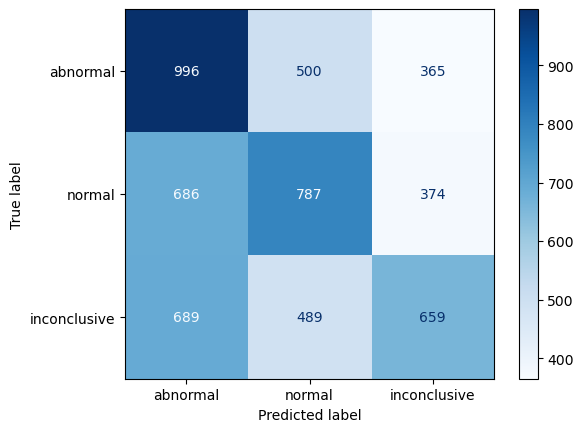

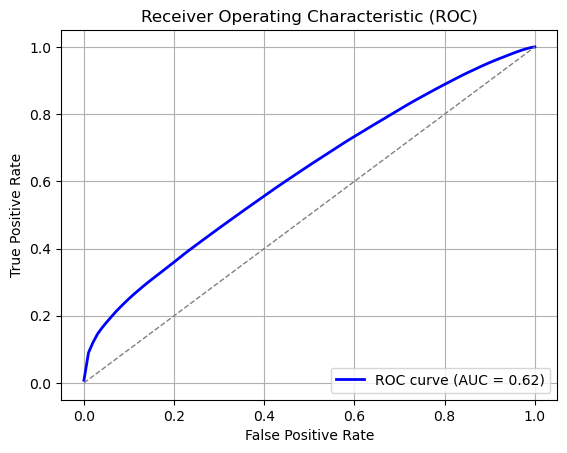

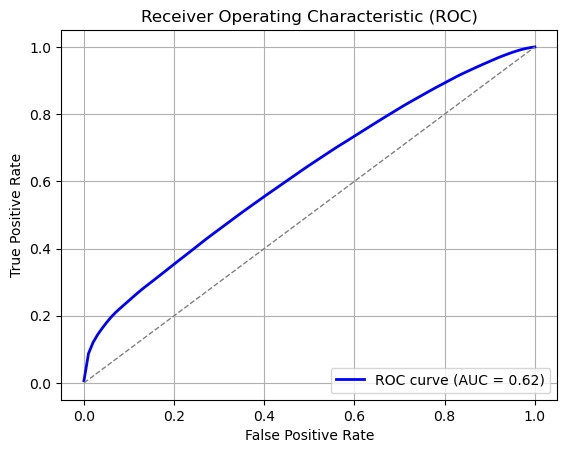

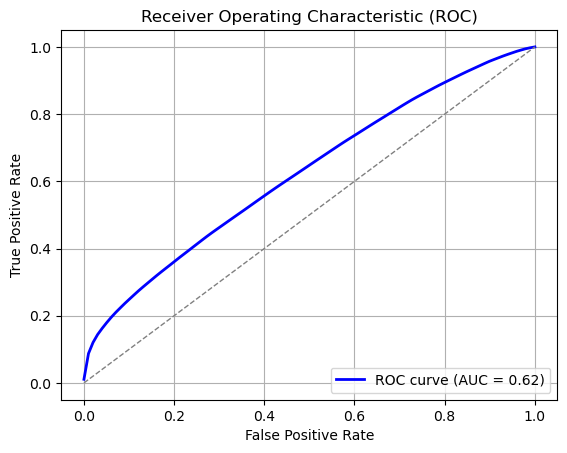

In [3]:
#################### RANDOM FOREST ID3 100%
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    rfc = random_forest.RandomForestClassifier(classifiers_number=50)
    rfc.fit(x_train, y_train, tree_percentage=1.0)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = rfc.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")

cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.42 0.3  0.28] 2.0
[0.22 0.3  0.48] 0.0
[0.52 0.22 0.26] 2.0
[0.3  0.16 0.54] 1.0
[0.3  0.26 0.44] 2.0
[0.22 0.62 0.16] 2.0
[0.68 0.12 0.2 ] 2.0
[0.38 0.42 0.2 ] 0.0
[0.48 0.38 0.14] 0.0
[0.26 0.4  0.34] 2.0
[0.34 0.46 0.2 ] 0.0
[0.56 0.38 0.06] 2.0
[0.22 0.34 0.44] 2.0
[0.32 0.24 0.44] 0.0
[0.12 0.4  0.48] 2.0
[0.3  0.14 0.56] 2.0
[0.28 0.22 0.5 ] 0.0
[0.68 0.28 0.04] 1.0
[0.22 0.48 0.3 ] 1.0
[0.2  0.64 0.16] 2.0
[0.46 0.16 0.38] 1.0
[0.62 0.18 0.2 ] 2.0
[0.52 0.2  0.28] 2.0
[0.26 0.38 0.36] 1.0
[0.38 0.46 0.16] 2.0
[0.22 0.34 0.44] 0.0
[0.24 0.64 0.12] 1.0
[0.54 0.22 0.24] 1.0
[0.22 0.3  0.48] 2.0
[0.26 0.36 0.38] 1.0
[0.26 0.16 0.58] 0.0
[0.74 0.08 0.18] 0.0
[0.36 0.24 0.4 ] 1.0
[0.3  0.14 0.56] 1.0
[0.48 0.3  0.22] 1.0
[0.22 0.7  0.08] 1.0
[0.22 0.1  0.68] 0.0
[0.58 0.2  0.22] 0.0
[0.38 0.38 0.24] 0.0
[0.24 0.5  0.26] 0.0
[0.56 0.14 0.3 ] 1.0
[0.62 0.2  0.18] 2.0
[0.46 0.34 0.2 ] 0.0
[0.48 0.24 0.28] 0.0
[0.48 0.34 0.18] 2.0
[0.34 0.14 0.52] 2.0
[0.42 0.52 0.06] 0.0
[0.62 0.16 0.

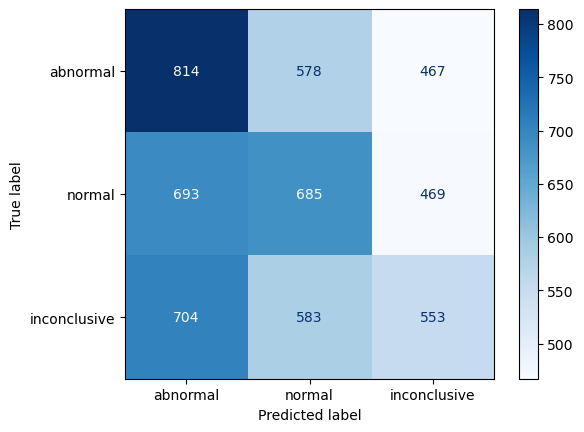

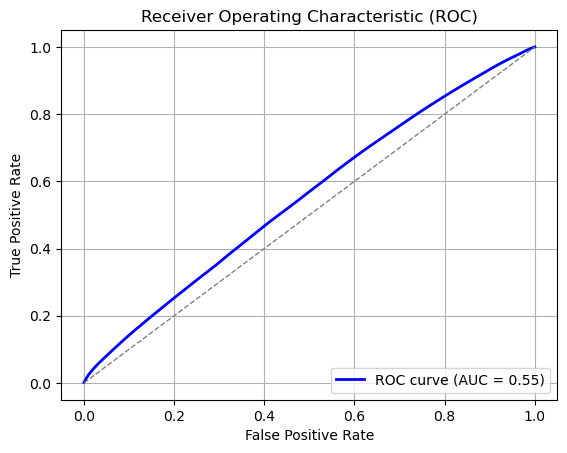

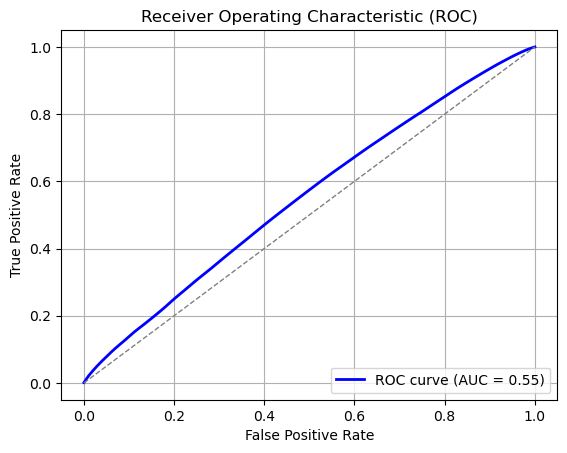

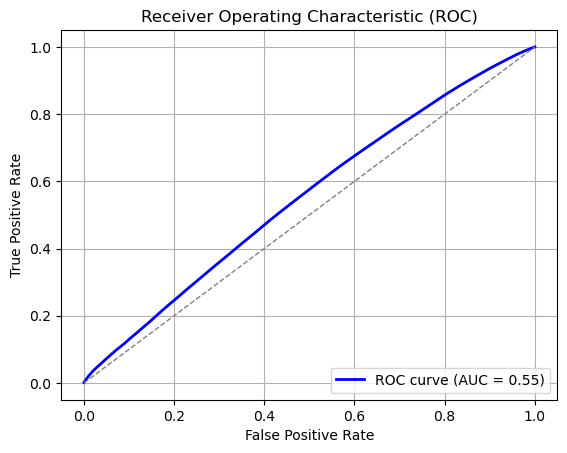

In [4]:
#################### RANDOM FOREST ID3/BAYES 50/50
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    rfc = random_forest.RandomForestClassifier(classifiers_number=50)
    rfc.fit(x_train, y_train, tree_percentage=0.5)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = rfc.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")

cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()